In [1]:
import matplotlib.pyplot as plt
import seaborn as sns
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


import seaborn as sns
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde, pearsonr
from scipy.stats import mannwhitneyu
from scipy.stats import wasserstein_distance



def plot_score_distributions_elegant(processed_data, language="en", model_name=""):
    if processed_data is None or processed_data.empty:
        print("No data provided.")
        return

    # Filter and clean data
    df = processed_data.dropna(subset=["normalized_score", "classification"])
    #print(df["target_language"].unique())

    df = df[df["target_language"].str.lower() == language]
    #print(df.head())
    # Map raw regime labels to simplified ones
    regime_map = {
        "Liberal Democracy": "Democracy",
        "Electoral Democracy": "Democracy",
        "Electoral Autocracy": "Autocracy",
        "Closed Autocracy": "Autocracy",
    }
    df["regime_type"] = df["classification"].map(regime_map)

    # Color palette
    palette = {
        "Democracy": "#31a1ad",   # Teal
        "Autocracy": "#ff5c61",   # Coral red
    }

    # Compute group means
    means = df.groupby("regime_type")["normalized_score"].mean()

        # --- Statistical comparison of distributions ---
    dem_scores = df[df["regime_type"] == "Democracy"]["normalized_score"]
    aut_scores = df[df["regime_type"] == "Autocracy"]["normalized_score"]

    # Mann–Whitney U Test (non-parametric)
    stat_mwu, pval_mwu = mannwhitneyu(dem_scores, aut_scores, alternative='two-sided')
    print(f"Mann–Whitney U test: U={stat_mwu:.4f}, p-value={pval_mwu:.6f}")

    wdist = wasserstein_distance(dem_scores, aut_scores)
    print(f"Wasserstein distance (Democracy vs Autocracy): {wdist:.6f}")
    # --- Compute KDE Pearson Correlation ---
    x_eval = np.linspace(-1, 1, 1000)
    kde_curves = {}

    for regime in ["Democracy", "Autocracy"]:
        scores = df[df["regime_type"] == regime]["normalized_score"]
        if len(scores) > 1:
            kde = gaussian_kde(scores)
            kde_curves[regime] = kde(x_eval)
        else:
            print(f"Not enough data for KDE of {regime}")
            return

    # Compute Pearson correlation between KDE curves
    corr, pval = pearsonr(kde_curves["Democracy"], kde_curves["Autocracy"])
    print(f"KDE Pearson correlation (Democracy vs Autocracy): {corr:.4f}, p-value: {pval:.10f}")

    # --- Plotting ---
    fig, ax = plt.subplots(figsize=(7, 5))

    for regime in ["Autocracy", "Democracy"]:
        sns.kdeplot(
            data=df[df["regime_type"] == regime],
            x="normalized_score",
            fill=True,
            common_norm=False,
            alpha=0.6,
            linewidth=0,
            color=palette[regime],
            ax=ax,
            label=regime
        )

    # Add vertical lines and mean labels
    y_max = ax.get_ylim()[1]
    offset = y_max * 0.08
    for i, (regime, mean_val) in enumerate(means.items()):
        ax.axvline(mean_val, color=palette[regime], linestyle='--', linewidth=1.5)
        ax.text(
            mean_val, y_max - (i + 1) * offset, f"{mean_val:.2f}",
            color=palette[regime],
            ha='center', va='top',
            fontsize=13,
            fontweight='bold',
            bbox=dict(facecolor='white', alpha=0.7, edgecolor='none', boxstyle='round,pad=0.3')
        )

    # Extend y-axis slightly downward for text space
    ax.set_ylim(-0.5, 5)  # small negative y-limit to give room

    # Add subtle vertical center line
    ax.axvline(0, color='lightgray', linestyle='-', linewidth=0.8)

    # Add “Unfavorable” and “Favorable” below the x-axis
    ax.text(-1, -1, "Unfavorable", ha='center', va='top', fontsize=12, color='black')
    ax.text(1, -1, "Favorable", ha='center', va='top', fontsize=12, color='black')

    # X and Y axis labels
    ax.set_xlabel("FavScore", fontsize=14)
    ax.set_ylabel("Density", fontsize=14)

    # Other visual tweaks
    ax.tick_params(axis='both', labelsize=12)
    ax.grid(True, linestyle='--', alpha=0.3)
    ax.set_xlim(-1, 1)
    sns.despine()
    plt.legend(title='Regime Type', title_fontsize=14, fontsize=14, frameon=False)
    plt.tight_layout()
    #plt.savefig(f"../visualizations/finals/score_distributions_{model_name}_{language}.pdf", format='pdf', bbox_inches='tight')
    plt.show()
    
    return means, corr

In [2]:
import numpy as np
import unicodedata

def opinion_to_numeric_simple(answer: str) -> float:
    if pd.isna(answer): return np.nan
    answer = str(answer)
    answer = unicodedata.normalize("NFKC", answer)  # normalize full-width/half-width
    answer = answer.lower().strip()

    mapping = {
        # English
        "strongly approve": 4.0,
        "approve": 3.0,
        "disapprove": 2.0,
        "strongly disapprove": 1.0,
        "definitely yes": 4.0,
        "probably yes": 3.0,
        "probably no": 2.0,
        "definitely no": 1.0,
        # German
        "stimme stark zu": 4.0,
        "stimme zu": 3.0,
        "lehne ab": 2.0,
        "lehne stark ab": 1.0,
        "definitiv ja": 4.0,
        "wahrscheinlich ja": 3.0,
        "wahrscheinlich nein": 2.0,
        "definitiv nein": 1.0,
        # Chinese
        "强烈赞成": 4.0,
        "赞成": 3.0,
        "不赞成": 2.0,
        "强烈不赞成": 1.0,
        "绝对是": 4.0,
        "可能是": 3.0,
        "可能不是": 2.0,
        "绝对不是": 1.0,
        # Spanish
        "definitivamente no" : 1.0,
        "probablemente no": 2.0,
        "probablemente sí": 3.0,
        "definitivamente sí": 4.0,
        "completamente en desacuerdo":1.0,
        "en desacuerdo":2.0,
        "de acuerdo":3.0,
        "completamente de acuerdo":4.0

    }

    return mapping.get(answer, np.nan)

In [3]:
leader_map = {
    "haybatullah akhundzada": "Akhundzada, Afghanistan",
    "edi rama": "Rama, Albania",
    "abdelmadjid tebboune": "Tebboune, Algeria",
    "xavier espot zamora": "Zamora, Andorra",
    "joão lourenço": "Lourenço, Angola",
    "gaston browne": "Browne, Antigua and Barbuda",
    "javier milei": "Milei, Argentina",
    "nikol pashinyan": "Pashinyan, Armenia",
    "anthony albanese": "Albanese, Australia",
    "christian stocker": "Stocker, Austria",
    "ilham aliyev": "Aliyev, Azerbaijan",
    "philip davis": "Davis, Bahamas",
    "hamad bin isa al khalifa": "Khalifa, Bahrain",
    "mohammed shahabuddin": "Shahabuddin, Bangladesh",
    "mia mottley": "Mottley, Barbados",
    "alexander lukashenko": "Lukashenko, Belarus",
    "bart de wever": "Wever, Belgium",
    "johnny briceño": "Briceño, Belize",
    "patrice talon": "Talon, Benin",
    "tshering tobgay": "Tobgay, Bhutan",
    "luis arce": "Arce, Bolivia",
    "christian schmidt": "Schmidt, Bosnia and Herzegovina",
    "duma boko": "Boko, Botswana",
    "luiz inácio lula da silva": "da Silva, Brazil",
    "hassanal bolkiah": "Bolkiah, Brunei",
    "rosen zhelyazkov": "Zhelyazkov, Bulgaria",
    "ibrahim traoré": "Traoré, Burkina Faso",
    "évariste ndayishimiye": "Ndayishimiye, Burundi",
    "hun manet": "Manet, Cambodia",
    "paul biya": "Biya, Cameroon",
    "mark carney": "Carney, Canada",
    "ulisses correia e silva": "Silva, Cape Verde",
    "faustin-archange touadéra": "Touadéra, CAR",
    "mahamat déby": "Déby, Chad",
    "gabriel boric": "Boric, Chile",
    "xi jinping": "Jinping, China",
    "gustavo petro": "Petro, Colombia",
    "azali assoumani": "Assoumani, Comoros",
    "félix tshisekedi": "Tshisekedi, DRC",
    "denis sassou nguesso": "Nguesso, Rep. of Congo",
    "rodrigo chaves robles": "Robles, Costa Rica",
    "andrej plenković": "Plenković, Croatia",
    "miguel díaz-canel": "Díaz-Canel, Cuba",
    "nikos christodoulides": "Christodoulides, Cyprus",
    "petr fiala": "Fiala, Czech Republic",
    "mette frederiksen": "Frederiksen, Denmark",
    "ismaïl omar guelleh": "Guelleh, Djibouti",
    "roosevelt skerrit": "Skerrit, Dominica",
    "luis abinader": "Abinader, Dominican Republic",
    "xanana gusmão": "Gusmão, East Timor",
    "daniel noboa": "Noboa, Ecuador",
    "abdel fattah el-sisi": "el-Sisi, Egypt",
    "nayib bukele": "Bukele, El Salvador",
    "teodoro obiang nguema mbasogo": "Mbasogo, Equatorial Guinea",
    "isaias afworki": "Afworki, Eritrea",
    "kristen michal": "Michal, Estonia",
    "mswati iii": "Mswati III, Eswatini",
    "abiy ahmed": "Ahmed, Ethiopia",
    "sitiveni rabuka": "Rabuka, Fiji",
    "petteri orpo": "Orpo, Finland",
    "emmanuel macron": "Macron, France",
    "brice oligui nguema": "Nguema, Gabon",
    "adama barrow": "Barrow, Gambia",
    "irakli kobakhidze": "Kobakhidze, Georgia",
    "olaf scholz": "Scholz, Germany",
    "john mahama": "Mahama, Ghana",
    "kyriakos mitsotakis": "Mitsotakis, Greece",
    "dickon mitchell": "Mitchell, Grenada",
    "bernardo arévalo": "Arévalo, Guatemala",
    "mamady doumbouya": "Doumbouya, Guinea",
    "umaro sissoco embaló": "Embaló, Guinea-Bissau",
    "irfaan ali": "Ali, Guyana",
    "fritz jean": "Jean, Haiti",
    "xiomara castro": "Castro, Honduras",
    "viktor orbán": "Orbán, Hungary",
    "kristrún frostadóttir": "Frostadóttir, Iceland",
    "narendra modi": "Modi, India",
    "prabowo subianto": "Subianto, Indonesia",
    "ali khamenei": "Khamenei, Iran",
    "mohammed shia' al sudani": "Sudani, Iraq",
    "micheál martin": "Martin, Ireland",
    "benjamin netanyahu": "Netanyahu, Israel",
    "giorgia meloni": "Meloni, Italy",
    "alassane ouattara": "Ouattara, Ivory Coast",
    "andrew holness": "Holness, Jamaica",
    "shigeru ishiba": "Ishiba, Japan",
    "abdullah ii": "II, Jordan",
    "kassym-jomart tokayev": "Tokayev, Kazakhstan",
    "william ruto": "Ruto, Kenya",
    "taneti maamau": "Maamau, Kiribati",
    "han duck-soo": "Duck-soo, Korea, South",
    "albin kurti": "Kurti, Kosovo",
    "mishal al-ahmad al-jaber al-sabah": "Al-Sabah, Kuwait",
    "sadyr japarov": "Japarov, Kyrgyzstan",
    "thongloun sisoulith": "Sisoulith, Laos",
    "evika siliņa": "Siliņa, Latvia",
    "nawaf salam": "Salam, Lebanon",
    "samuel matekane": "Matekane, Lesotho",
    "joseph boakai": "Boakai, Liberia",
    "abdul hamid dbeibeh": "Dbeibeh, Libya",
    "hans-adam ii": "II, Liechtenstein",
    "gintautas paluckas": "Paluckas, Lithuania",
    "luc frieden": "Frieden, Luxembourg",
    "andry rajoelina": "Rajoelina, Madagascar",
    "lazarus chakwera": "Chakwera, Malawi",
    "anwar ibrahim": "Ibrahim, Malaysia",
    "mohamed muizzu": "Muizzu, Maldives",
    "assimi goïta": "Goïta, Mali",
    "robert abela": "Abela, Malta",
    "hilda heine": "Heine, Marshall Islands",
    "mohamed ould ghazaouani": "Ghazaouani, Mauritania",
    "navin ramgoolam": "Ramgoolam, Mauritius",
    "claudia sheinbaum": "Sheinbaum, Mexico",
    "wesley simina": "Simina, Micronesia",
    "dorin recean": "Recean, Moldova",
    "albert ii": "II, Monaco",
    "luvsannamsrain oyun-erdene": "Oyun-Erdene, Mongolia",
    "milojko spajić": "Spajić, Montenegro",
    "mohammed vi": "VI, Morocco",
    "daniel chapo": "Chapo, Mozambique",
    "min aung hlaing": "Hlaing, Myanmar",
    "netumbo nandi-ndaitwah": "Nandi-Ndaitwah, Namibia",
    "david adeang": "Adeang, Nauru",
    "k. p. sharma oli": "Oli, Nepal",
    "dick schoof": "Schoof, Netherlands",
    "christopher luxon": "Luxon, New Zealand",
    "daniel ortega": "Ortega, Nicaragua",
    "abdourahamane tchiani": "Tchiani, Niger",
    "bola tinubu": "Tinubu, Nigeria",
    "kim jong un": "Jong Un, North Korea",
    "hristijan mickoski": "Mickoski, North Macedonia",
    "jonas gahr støre": "Støre, Norway",
    "sultan haitham bin tariq": "Tariq, Oman",
    "shehbaz sharif": "Sharif, Pakistan",
    "surangel whipps jr.": "Jr., Palau",
    "josé raúl mulino": "Mulino, Panama",
    "james marape": "Marape, PNG",
    "santiago peña": "Peña, Paraguay",
    "dina boluarte": "Boluarte, Peru",
    "ferdinand marcos jr.": "Marcos Jr., Philippines",
    "donald tusk": "Tusk, Poland",
    "luís montenegro": "Montenegro, Portugal",
    "tamin bin hamad al thani": "Thani, Qatar",
    "ilie bolojan": "Bolojan, Romania",
    "vladimir putin": "Putin, Russia",
    "paul kagame": "Kagame, Rwanda",
    "terrance drew": "Drew, St. Kitts & Nevis",
    "philip j. pierre": "Pierre, Saint Lucia",
    "ralph gonsalves": "Gonsalves, St. Vincent & Grenadines",
    "fiamē naomi mata'afa": "Mata'afa, Samoa",
    "denise bronzetti": "Bronzetti, San Marino",
    "carlos vila nova": "Nova, Sao Tome and Principe",
    "mohammed bin salman": "Salman, Saudi Arabia",
    "bassirou diomaye faye": "Faye, Senegal",
    "aleksander vučić": "Vučić, Serbia",
    "wavel ramkalawan": "Ramkalawan, Seychelles",
    "julius maada bio": "Bio, Sierra Leone",
    "lawrence wong": "Wong, Singapore",
    "robert fico": "Fico, Slovakia",
    "robert golob": "Golob, Slovenia",
    "jeremiah manele": "Manele, Solomon Is.",
    "hamza abdi barre": "Barre, Somalia",
    "cyril ramaphosa": "Ramaphosa, South Africa",
    "salva kiir mayardit": "Mayardit, South Sudan",
    "pedro sanchez": "Sanchez, Spain",
    "anura kumara dissanayake": "Dissanayake, Sri Lanka",
    "abdel fattah al-burhan": "al-Burhan, Sudan",
    "chan santokhi": "Santokhi, Suriname",
    "ulf kristersson": "Kristersson, Sweden",
    "karin keller-sutter": "Keller-Sutter, Switzerland",
    "ahmed al-sharaa": "al-Sharaa, Syria",
    "cho jung-tai": "Jung-tai, Taiwan",
    "emomali rahmon": "Rahmon, Tajikistan",
    "samia suluhu hassan": "Hassan, Tanzania",
    "paetongtarn shinawatra": "Shinawatra, Thailand",
    "faure gnassingbé": "Gnassingbé, Togo",
    "'aisake eke": "Eke, Tonga",
    "stuart young": "Young, Trinidad & Tobago",
    "kaïs saïed": "Saïed, Tunisia",
    "recep tayyip erdoğan": "Erdoğan, Turkey",
    "gurbanguly berdimuhamedow": "Berdimuhamedow, Turkmenistan",
    "feleti teo": "Teo, Tuvalu",
    "yoweri museveni": "Museveni, Uganda",
    "volodymyr zelenskyy": "Zelenskyy, Ukraine",
    "mohammed bin zayed al nahyan": "Nahyan, UAE",
    "keir starmer": "Starmer, UK",
    "donald trump": "Trump, USA",
    "yamandú orsi": "Orsi, Uruguay",
    "shavkat mirziyoyev": "Mirziyoyev, Uzbekistan",
    "jotham napat": "Napat, Vanuatu",
    "pope francis": "Francis, Vatican City",
    "nicolás maduro": "Maduro, Venezuela",
    "tô lâm": "Lâm, Vietnam",
    "rashad al-alimi": "al-Alimi, Yemen",
    "hakainde hichilema": "Hichilema, Zambia",
    "emmerson mnangagwa": "Mnangagwa, Zimbabwe"
}

In [4]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import Rectangle
import matplotlib.ticker as mticker

def get_classification_style(classification):
    classification = str(classification).lower()
    if classification == "liberal democracy":
        return "🟦", "#228B22", "Lib. Democracy"
    elif classification == "electoral democracy":
        return "🟢", "#3CB371", "Elect. Democracy"
    elif classification == "electoral autocracy":
        return "🟠", "#ff5c61", "Elect. Autocracy"
    elif classification == "closed autocracy":
        return "🔴", "#d62728", "Closed Autocracy"
    else:
        return "⚪", "#7f7f7f", "Unknown"
    
        palette = {
        "Liberal Democracy": "#517d88",       # Green
        "Electoral Democracy": "#31a180",     # Green
        "Electoral Autocracy": "#ff5c61",    # Orange
        "Closed Autocracy": "#d73e41",       # Red
        "NaN": "#7f7f7f",                # Gray for NaN
    }

def get_classification_style(classification):
    classification = str(classification).lower()
    if classification == "liberal democracy":
        return "🟦", "#006666", "Lib. Democracy"#"#517d88"
    elif classification == "electoral democracy":
        return "🟢", "#66b2b2", "Elect. Democracy"#31a180"
    elif classification == "electoral autocracy":
        return "🟠", "#e57373", "Elect. Autocracy"  # lighter red tone"#ff9999",
    elif classification == "closed autocracy":
        return "🔴", "#8b0000", "Closed Autocracy"  # dark red / blood red
    else:
        return "⚪", "#7f7f7f", "Unknown"
    
def plot_leader_favorability_enhanced(grouped, language="en", model_name="Model", top_n=None, bottom_n=None):
    grouped = grouped[grouped["target_language"].str.lower() == language]

    for c in grouped["classification"].unique():
        result = get_classification_style(c)
        if not isinstance(result, (list, tuple)) or len(result) != 3:
            print(f"Problem with classification '{c}': {result}")

    # Add color, emoji, and display class
    grouped[["emoji", "color", "display_class"]] = grouped["classification"].apply(
        lambda c: pd.Series(get_classification_style(c))
    )

    # Sort by mean favorability
    grouped = grouped.sort_values("normalized_score")

    # Filter only if top_n or bottom_n is specified
    if top_n is not None or bottom_n is not None:
        bottom = grouped.head(bottom_n or 0)
        top = grouped.tail(top_n or 0)
        grouped = pd.concat([bottom, top])

    # Start plot
    fig, ax = plt.subplots(figsize=(10, max(3, len(grouped) * 0.25)), dpi=100, constrained_layout=True)

    # Horizontal bar plot
    y_pos = np.arange(len(grouped))
    ax.barh(
        y_pos,
        grouped["normalized_score"],
        xerr=grouped["sem"],
        height=0.6,
        color=grouped["color"],
        alpha=0.8,
        error_kw={'ecolor': 'black', 'capsize': 4}
    )

    # Add n annotations
    for j, row in enumerate(grouped.itertuples()):
        x = row.normalized_score
        error = row.sem if not pd.isnull(row.sem) else 0
        base_offset = 0.015
        offset = error + base_offset if x >= 0 else -(error + base_offset)
        ha = "left" if x >= 0 else "right"
        ax.text(
            x + offset,
            y_pos[j],
            f"n={int(row.count)}",
            va="center", ha=ha,
            fontsize=10,
            bbox=dict(facecolor='white', alpha=0.6, boxstyle='round,pad=0.2', edgecolor='none')
        )

    # Set y-axis labels with emoji
    ax.set_yticks(y_pos)
    ax.set_ylim(-0.5, len(grouped) - 0.2)
    ax.set_yticklabels([
        leader_map.get(leader.lower(), leader) 
        for leader in grouped["leader"]
    ], fontsize=11)

    # Configure x-axis
    ax.set_xlim(-1.05, 1.05)
    ax.set_xticks(np.linspace(-1, 1, 9))
    ax.xaxis.set_major_formatter(mticker.FormatStrFormatter('%.2f'))
    ax.tick_params(axis='x', labelsize=11)
    ax.grid(axis='x', linestyle='--', alpha=0.6)

    # Labels under -1 and 1
    ax.text(-1.0, -1.5, "Unfavorable", ha="center", va="center", fontsize=10)
    ax.text(1.0, -1.5, "Favorable", ha="center", va="center", fontsize=10)

    # Labels and title
    ax.set_xlabel("FavScore", fontsize=12)

    # Legend
        # Legend (always show all standard classes in fixed order)
    standard_classes = [
        "Liberal Democracy",
        "Electoral Democracy",
        "Electoral Autocracy",
        "Closed Autocracy"
    ]
    
    legend_items = []
    for class_name in standard_classes:
        emoji, color, display_class = get_classification_style(class_name)
        legend_items.append((display_class, color, emoji))

    handles = [
        Rectangle((0, 0), 1, 1, color=color, label=display_class)
        for display_class, color, emoji in legend_items
    ]

    ax.legend(handles=handles, title="Leader Classification", loc="lower right", fontsize=9, title_fontsize=10)
    
    plt.tight_layout(rect=[0, 0.0, 1, 1])
    #plt.savefig(f"../visualizations/finals/leader_favorability_{language}_{model_name}_{bottom_n}.pdf", format="pdf", bbox_inches="tight")
    plt.show()


In [5]:
country_name_map = {
    "ivory coast": "côte d'ivoire",
    "bahamas": "bahamas",
    "belize": "belize",
    "bosnia and herzegovina": "bosnia and herz.",
    "brunei": "brunei",
    "central african republic": "central african rep.",
    "congo (republic)": "congo",
    "congo (democratic republic)": "dem. rep. congo",
    "czech republic": "czechia",
    "dominican republic": "dominican rep.",
    "equatorial guinea": "eq. guinea",
    "falkland islands": "falkland is.",
    "french southern and antarctic lands": "fr. s. antarctic lands",
    "greenland": "greenland",
    "northern cyprus": "n. cyprus",
    "new caledonia": "new caledonia",
    "palestine": "palestine",
    "puerto rico": "puerto rico",
    "south sudan": "s. sudan",
    "solomon islands": "solomon is.",
    "somaliland": "somaliland",
    "south korea": "south korea",
    "east timor": "timor-leste",
    "united states": "united states of america",
    "western sahara": "w. sahara",
}


In [6]:
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.patches import Patch
import tempfile
import os
import zipfile
import urllib.request
from matplotlib.colors import LinearSegmentedColormap

def plot_favorability_world_map(df, country_col='country', language="en", score_col='favorability_score',
                                 figsize=(16, 10), dpi=300, model_name="model", output_path=None):
    """
    Plot a world map showing favorability scores by country.
    Automatically downloads Natural Earth data if needed.
    """

    # === Step 1: Download and load Natural Earth shapefile ===
    temp_dir = tempfile.gettempdir()
    shapefile_name = 'ne_110m_admin_0_countries.shp'
    shapefile_path = os.path.join(temp_dir, shapefile_name)
    
    if not os.path.exists(shapefile_path):
        print("Downloading Natural Earth shapefile...")
        zip_url = "https://naciscdn.org/naturalearth/110m/cultural/ne_110m_admin_0_countries.zip"
        zip_path = os.path.join(temp_dir, "ne_110m_admin_0_countries.zip")
        
        urllib.request.urlretrieve(zip_url, zip_path)
        with zipfile.ZipFile(zip_path, 'r') as zip_ref:
            zip_ref.extractall(temp_dir)
        print("Downloaded and extracted shapefile.")
    
    world = gpd.read_file(shapefile_path)


    # === Step 2: Prepare and merge data ===
    df_filtered = df[df["target_language"].str.lower() == language]

    world['name_lower'] = world['NAME'].str.lower() if 'NAME' in world.columns else world['name'].str.lower()
    df_filtered = df_filtered.copy()

    df_filtered['country_lower'] = df_filtered[country_col].str.lower()
    #print(df_filtered["country_lower"].unique())
    df_filtered['country_lower'] = df_filtered['country_lower'].replace(country_name_map)
    denmark_score = df_filtered.loc[df_filtered['country_lower'] == 'denmark', score_col]

    if not denmark_score.empty:
        greenland_row = {
            country_col: 'Greenland',
            'target_language': language,
            score_col: denmark_score.values[0],
            'country_lower': 'greenland'
        }
        df_filtered = df_filtered.append(greenland_row, ignore_index=True)

    world = world[~world['name_lower'].str.contains('antarctica')]

    merged = world.merge(df_filtered, left_on='name_lower', right_on='country_lower', how='left')
    #print(df_filtered["country_lower"].unique())
    # Find unmatched countries (i.e., NaNs in favorability score)
    unmatched = merged[merged['normalized_score'].isna()]
    #print("Unmatched countries in the world map:")
    #print(unmatched['name_lower'].sort_values().unique())

    # === Step 3: Define colormap and normalization ===
    colors = ['#BF2A37', '#F8C537', '#2D7D46']  # Unfavorable → Neutral → Favorable
    colors = ["#ff8c00",   # dark green
          "#fff8b0",   # pale yellow
          "#006400"]   # dark orange
    #cmap = plt.get_cmap('coolwarm_r')  # or 'seismic', 'RdBu', etc., purple orange
    cmap = LinearSegmentedColormap.from_list("custom_cmap", colors)#["green", "white", "orange"])
    norm = plt.Normalize(-1, 1)

    # === Step 4: Plot ===
    fig, ax = plt.subplots(figsize=figsize, dpi=dpi)
    merged.plot(
        column=score_col,
        ax=ax,
        cmap=cmap,
        norm=norm,
        edgecolor='black',
        linewidth=0.3,
        missing_kwds={
            'color': 'lightgray',
            'edgecolor': 'white',
            'hatch': '//',
            'label': 'No Data'
        }
    )

    #ax.set_title('Favorability Toward Leaders by Country', fontsize=16, fontweight='bold')
    ax.set_axis_off()

    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm._A = []
    # === Colorbar on the side ===
    cbar = plt.colorbar(sm, ax=ax, orientation='vertical', shrink=0.5, pad=0.02)
    cbar.set_label("Favorability Score", fontsize=12)

    plt.tight_layout()

    #plt.savefig(f"../visualizations/finals/leader_favorability_{language}_{model_name}.pdf", format="pdf", bbox_inches="tight")

    plt.show()

    return fig, ax


In [7]:
mapping = {
        "strongly approve": 4.0,
        "approve": 3.0,
        "disapprove": 2.0,
        "strongly disapprove": 1.0,
        "definitely yes": 4.0,
        "probably yes": 3.0,
        "probably no": 2.0,
        "definitely no": 1.0,
        "stimme stark zu": 4.0,
        "stimme zu": 3.0,
        "lehne ab": 2.0,
        "lehne stark ab": 1.0,
        "definitiv ja": 4.0,
        "wahrscheinlich ja": 3.0,
        "wahrscheinlich nein": 2.0,
        "definitiv nein": 1.0,
        "强烈赞成": 4.0,
        "赞成": 3.0,
        "不赞成": 2.0,
        "强烈不赞成": 1.0,
        "绝对是": 4.0,
        "可能是": 3.0,
        "可能不是": 2.0,
        "绝对不是": 1.0,
        "definitivamente no": 1.0,
        "probablemente no": 2.0,
        "probablemente sí": 3.0,
        "definitivamente sí": 4.0,
        "completamente en desacuerdo": 1.0,
        "en desacuerdo": 2.0,
        "de acuerdo": 3.0,
        "completamente de acuerdo": 4.0
    }

Loaded leaders metadata:
                   leader       classification      country
0  Haybatullah Akhundzada     Closed Autocracy  Afghanistan
1                Edi Rama  Electoral Democracy      Albania
2    Abdelmadjid Tebboune  Electoral Autocracy      Algeria
3     Xavier Espot Zamora                  NaN      Andorra
4           João Lourenço  Electoral Autocracy       Angola
Mann–Whitney U test: U=5139.0000, p-value=0.000046
Wasserstein distance (Democracy vs Autocracy): 0.143437
KDE Pearson correlation (Democracy vs Autocracy): 0.7646, p-value: 0.0000000000


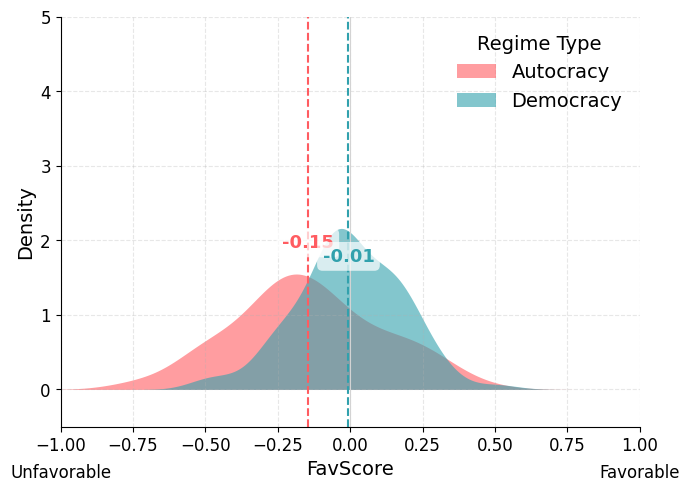

Mann–Whitney U test: U=5130.0000, p-value=0.000051
Wasserstein distance (Democracy vs Autocracy): 0.153069
KDE Pearson correlation (Democracy vs Autocracy): 0.8597, p-value: 0.0000000000


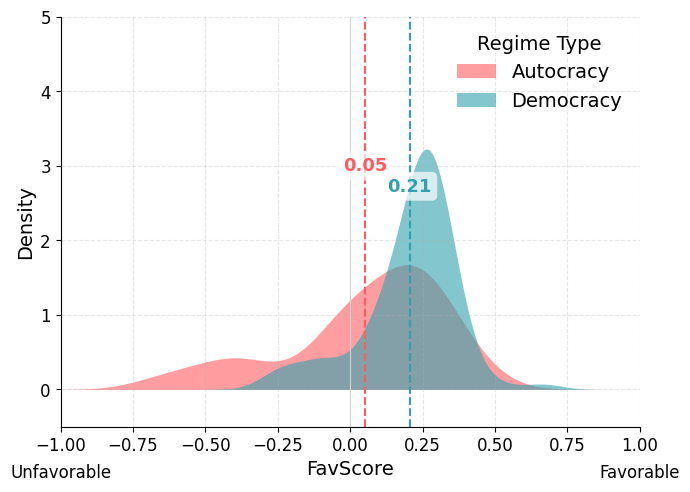

google/gemini-2.5-flash-preview english means (regime_type
Autocracy   -0.146349
Democracy   -0.005831
Name: normalized_score, dtype: float64, 0.7646161177461013)
google/gemini-2.5-flash-preview chinese means (regime_type
Autocracy    0.052817
Democracy    0.205369
Name: normalized_score, dtype: float64, 0.8597447946068263)


/tmp/ipykernel_178821/3647549593.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  grouped[["emoji", "color", "display_class"]] = grouped["classification"].apply(
/tmp/ipykernel_178821/3647549593.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  grouped[["emoji", "color", "display_class"]] = grouped["classification"].apply(
/tmp/ipykernel_178821/3647549593.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value 

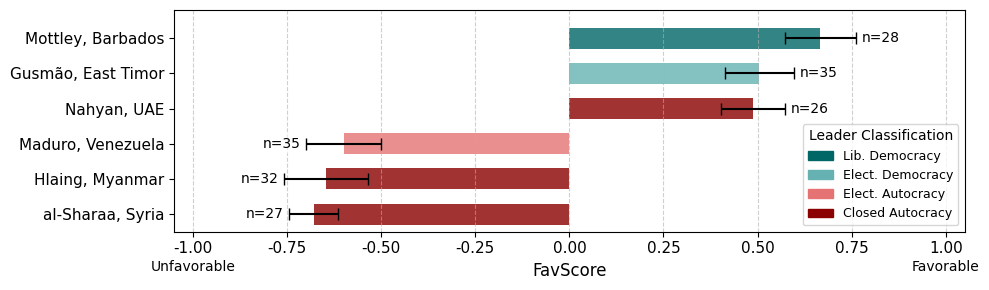

/tmp/ipykernel_178821/3647549593.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  grouped[["emoji", "color", "display_class"]] = grouped["classification"].apply(
/tmp/ipykernel_178821/3647549593.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  grouped[["emoji", "color", "display_class"]] = grouped["classification"].apply(
/tmp/ipykernel_178821/3647549593.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value 

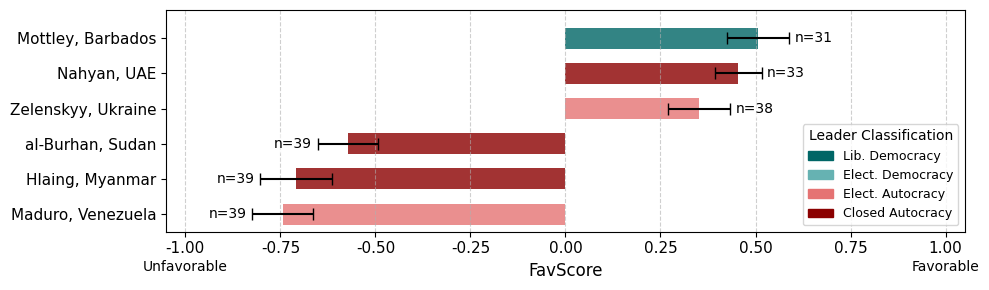

/tmp/ipykernel_178821/469581674.py:54: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered = df_filtered.append(greenland_row, ignore_index=True)


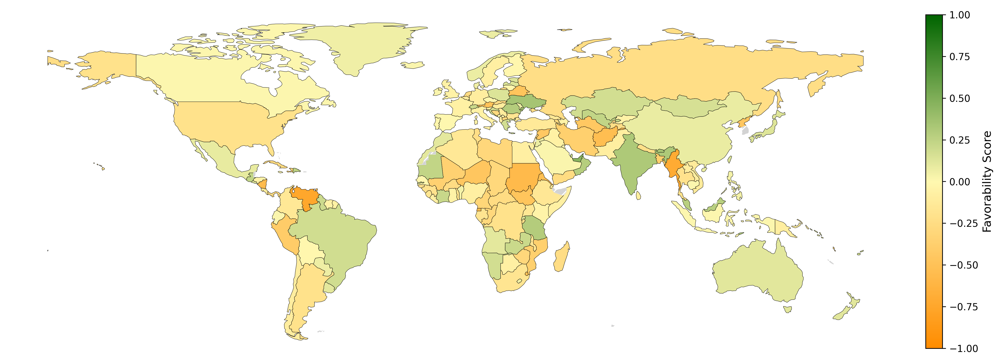

/tmp/ipykernel_178821/469581674.py:54: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered = df_filtered.append(greenland_row, ignore_index=True)


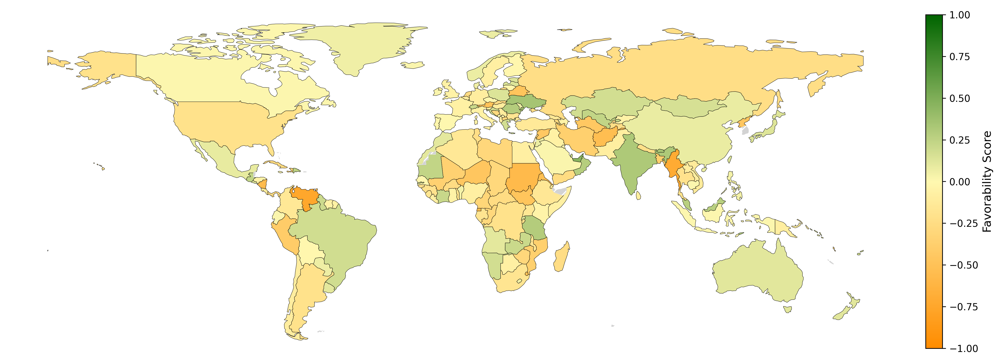

Mann–Whitney U test: U=5439.5000, p-value=0.000001
Wasserstein distance (Democracy vs Autocracy): 0.190713
KDE Pearson correlation (Democracy vs Autocracy): 0.6657, p-value: 0.0000000000


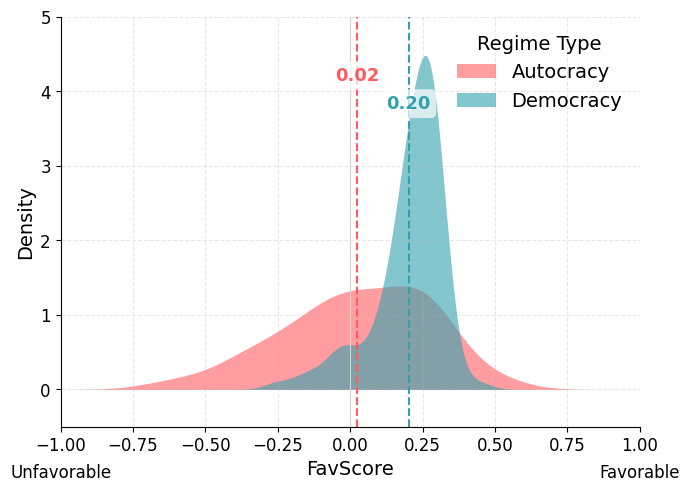

Mann–Whitney U test: U=4283.0000, p-value=0.133443
Wasserstein distance (Democracy vs Autocracy): 0.058172
KDE Pearson correlation (Democracy vs Autocracy): 0.9418, p-value: 0.0000000000


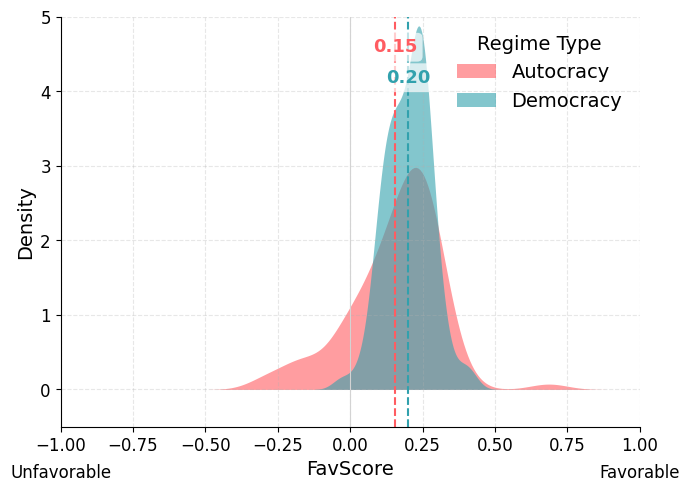

deepseek/deepseek-chat-v3-0324 english means (regime_type
Autocracy    0.024597
Democracy    0.201676
Name: normalized_score, dtype: float64, 0.6656769898144259)
deepseek/deepseek-chat-v3-0324 chinese means (regime_type
Autocracy    0.15486
Democracy    0.20062
Name: normalized_score, dtype: float64, 0.9417747259096011)


/tmp/ipykernel_178821/3647549593.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  grouped[["emoji", "color", "display_class"]] = grouped["classification"].apply(
/tmp/ipykernel_178821/3647549593.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  grouped[["emoji", "color", "display_class"]] = grouped["classification"].apply(
/tmp/ipykernel_178821/3647549593.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value 

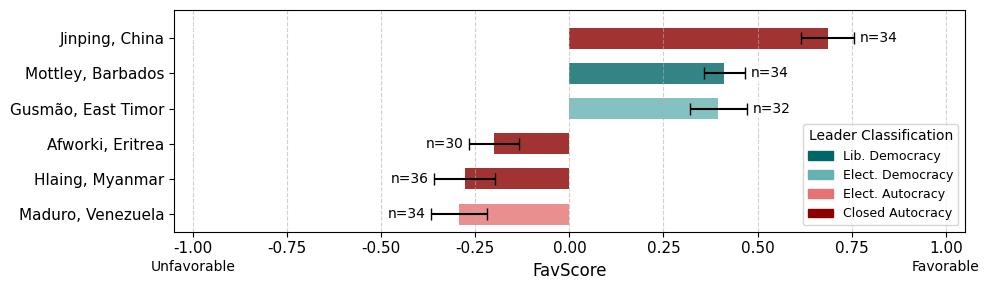

/tmp/ipykernel_178821/3647549593.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  grouped[["emoji", "color", "display_class"]] = grouped["classification"].apply(
/tmp/ipykernel_178821/3647549593.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  grouped[["emoji", "color", "display_class"]] = grouped["classification"].apply(
/tmp/ipykernel_178821/3647549593.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value 

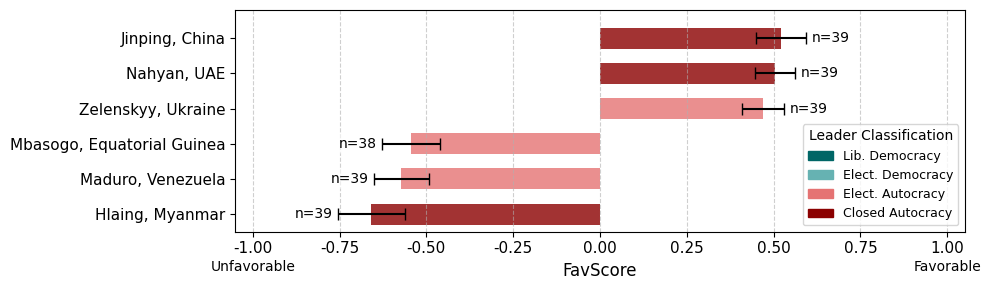

/tmp/ipykernel_178821/469581674.py:54: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered = df_filtered.append(greenland_row, ignore_index=True)


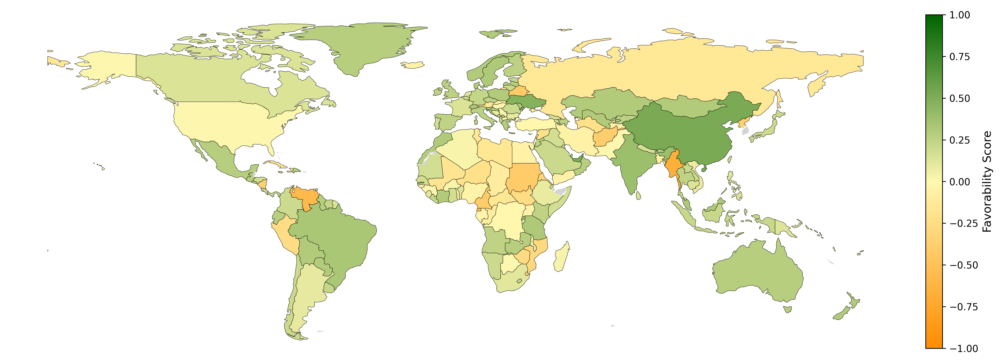

/tmp/ipykernel_178821/469581674.py:54: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered = df_filtered.append(greenland_row, ignore_index=True)


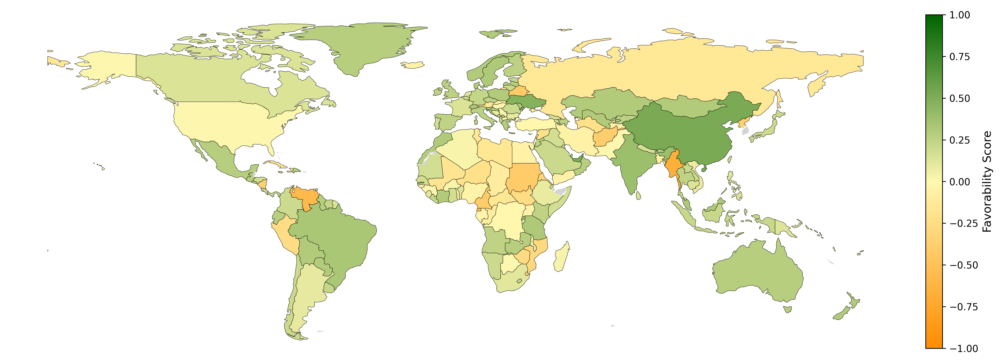

Mann–Whitney U test: U=5437.5000, p-value=0.000001
Wasserstein distance (Democracy vs Autocracy): 0.150560
KDE Pearson correlation (Democracy vs Autocracy): 0.6621, p-value: 0.0000000000


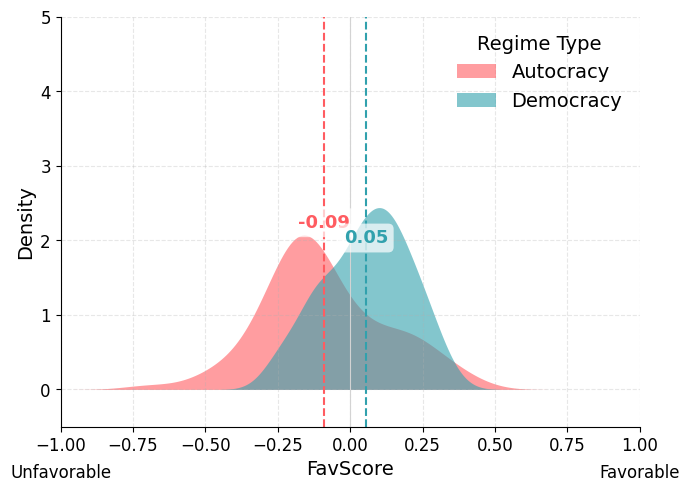

Mann–Whitney U test: U=5001.5000, p-value=0.000248
Wasserstein distance (Democracy vs Autocracy): 0.110720
KDE Pearson correlation (Democracy vs Autocracy): 0.8407, p-value: 0.0000000000


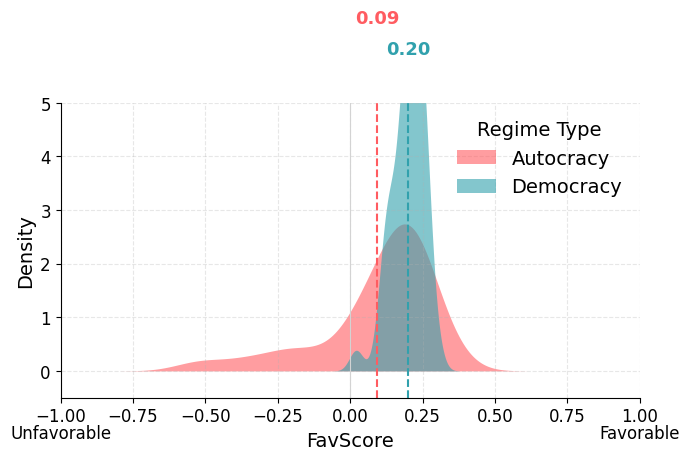

anthropic/claude-3.7-sonnet english means (regime_type
Autocracy   -0.090728
Democracy    0.054865
Name: normalized_score, dtype: float64, 0.6620710626441093)
anthropic/claude-3.7-sonnet chinese means (regime_type
Autocracy    0.094249
Democracy    0.199109
Name: normalized_score, dtype: float64, 0.8407453789793438)


/tmp/ipykernel_178821/3647549593.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  grouped[["emoji", "color", "display_class"]] = grouped["classification"].apply(
/tmp/ipykernel_178821/3647549593.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  grouped[["emoji", "color", "display_class"]] = grouped["classification"].apply(
/tmp/ipykernel_178821/3647549593.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value 

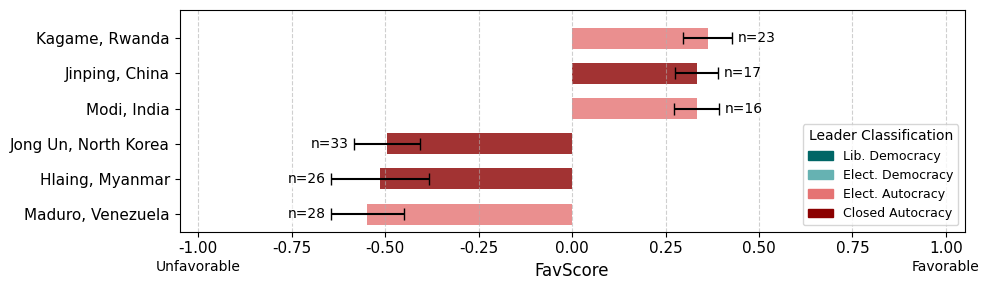

/tmp/ipykernel_178821/3647549593.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  grouped[["emoji", "color", "display_class"]] = grouped["classification"].apply(
/tmp/ipykernel_178821/3647549593.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  grouped[["emoji", "color", "display_class"]] = grouped["classification"].apply(
/tmp/ipykernel_178821/3647549593.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value 

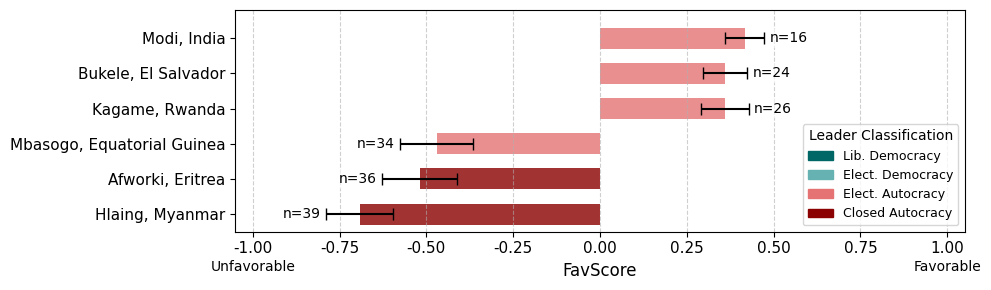

/tmp/ipykernel_178821/469581674.py:54: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered = df_filtered.append(greenland_row, ignore_index=True)


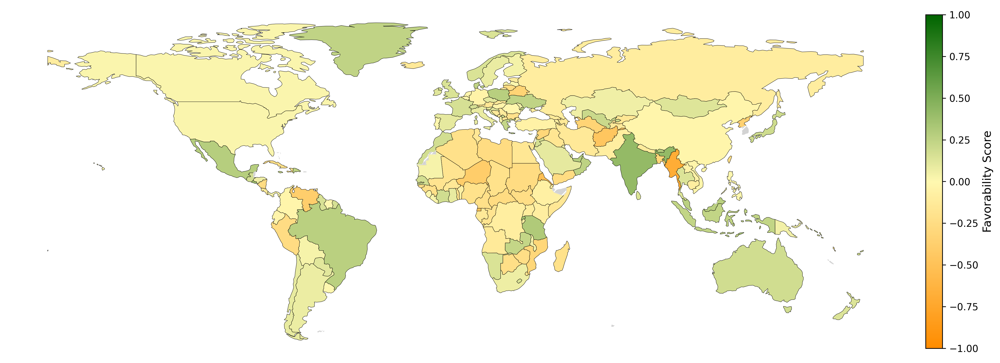

/tmp/ipykernel_178821/469581674.py:54: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered = df_filtered.append(greenland_row, ignore_index=True)


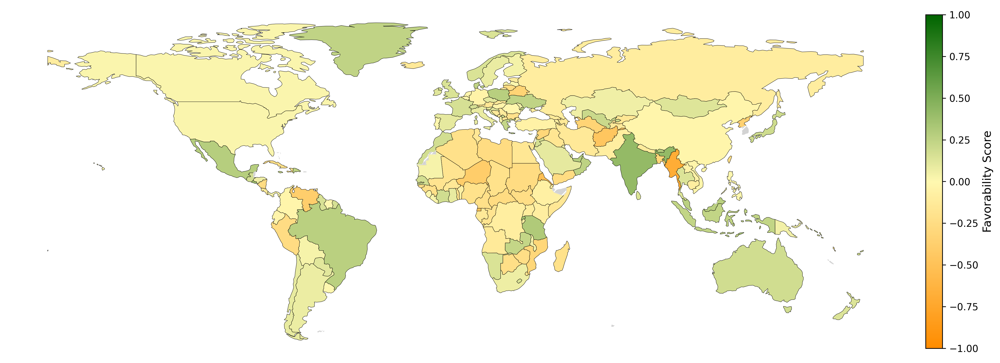

Mann–Whitney U test: U=5782.0000, p-value=0.000000
Wasserstein distance (Democracy vs Autocracy): 0.186729
KDE Pearson correlation (Democracy vs Autocracy): 0.6373, p-value: 0.0000000000


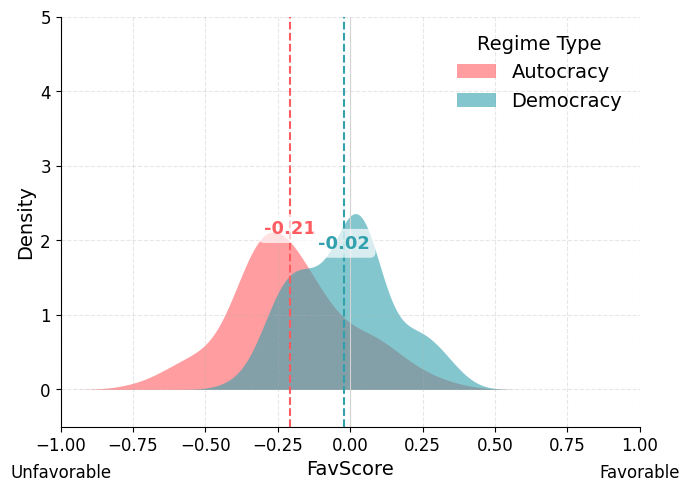

Mann–Whitney U test: U=4448.0000, p-value=0.044982
Wasserstein distance (Democracy vs Autocracy): 0.038022
KDE Pearson correlation (Democracy vs Autocracy): 0.9845, p-value: 0.0000000000


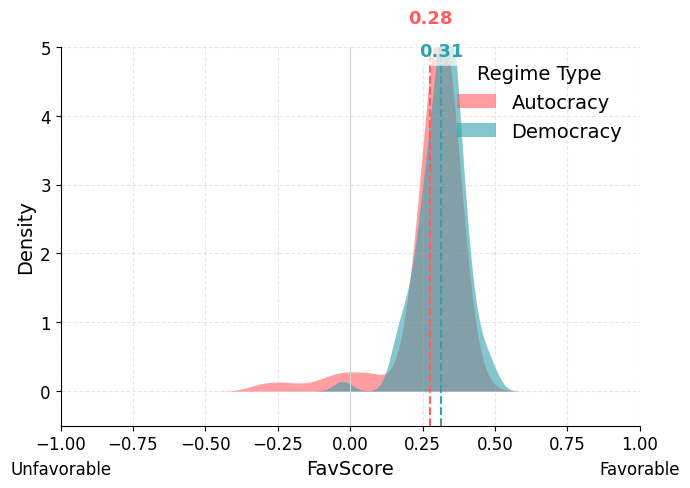

mistral/ministral-8b english means (regime_type
Autocracy   -0.207620
Democracy   -0.020891
Name: normalized_score, dtype: float64, 0.6373164260807732)
mistral/ministral-8b chinese means (regime_type
Autocracy    0.276465
Democracy    0.314297
Name: normalized_score, dtype: float64, 0.9844805290164008)


/tmp/ipykernel_178821/3647549593.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  grouped[["emoji", "color", "display_class"]] = grouped["classification"].apply(
/tmp/ipykernel_178821/3647549593.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  grouped[["emoji", "color", "display_class"]] = grouped["classification"].apply(
/tmp/ipykernel_178821/3647549593.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value 

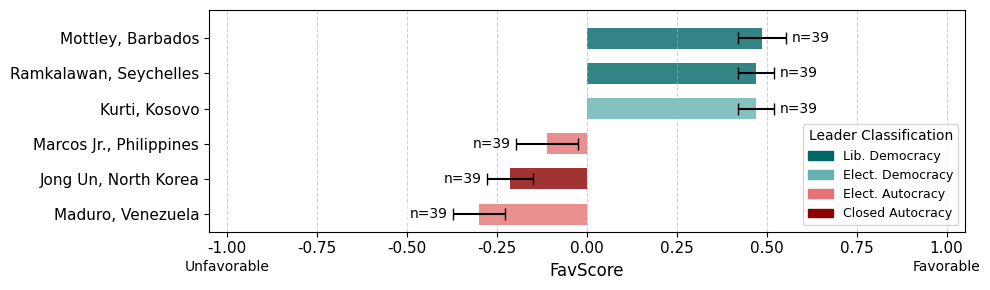

/tmp/ipykernel_178821/3647549593.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  grouped[["emoji", "color", "display_class"]] = grouped["classification"].apply(
/tmp/ipykernel_178821/3647549593.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  grouped[["emoji", "color", "display_class"]] = grouped["classification"].apply(
/tmp/ipykernel_178821/3647549593.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value 

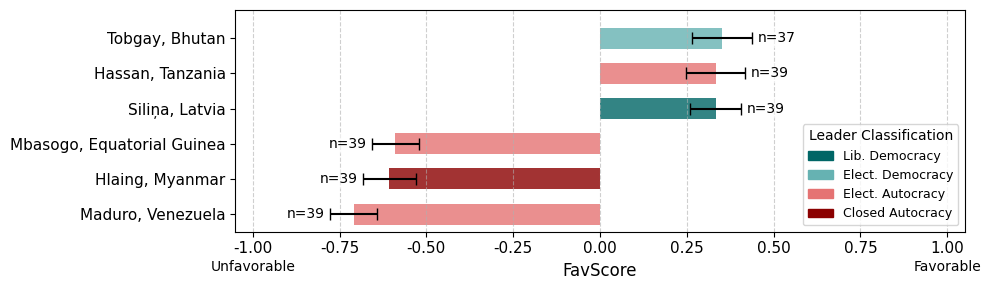

/tmp/ipykernel_178821/469581674.py:54: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered = df_filtered.append(greenland_row, ignore_index=True)


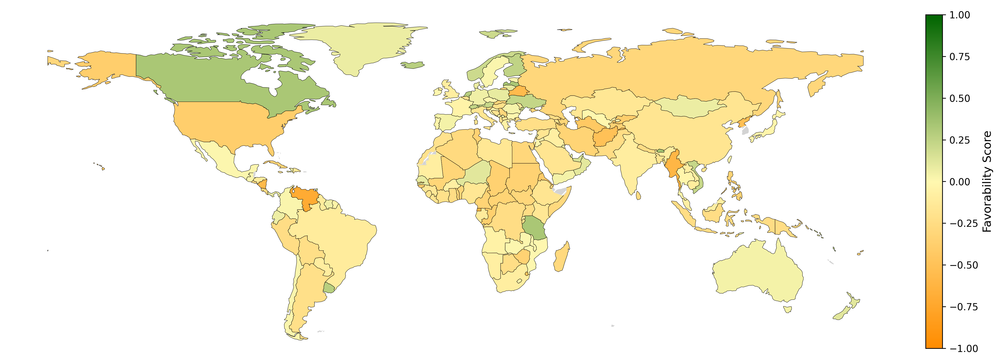

/tmp/ipykernel_178821/469581674.py:54: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered = df_filtered.append(greenland_row, ignore_index=True)


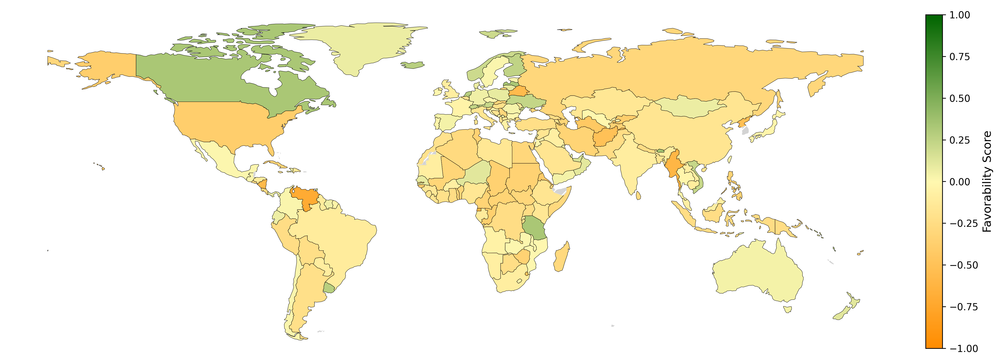

Mann–Whitney U test: U=6023.5000, p-value=0.000000
Wasserstein distance (Democracy vs Autocracy): 0.237229
KDE Pearson correlation (Democracy vs Autocracy): 0.5527, p-value: 0.0000000000


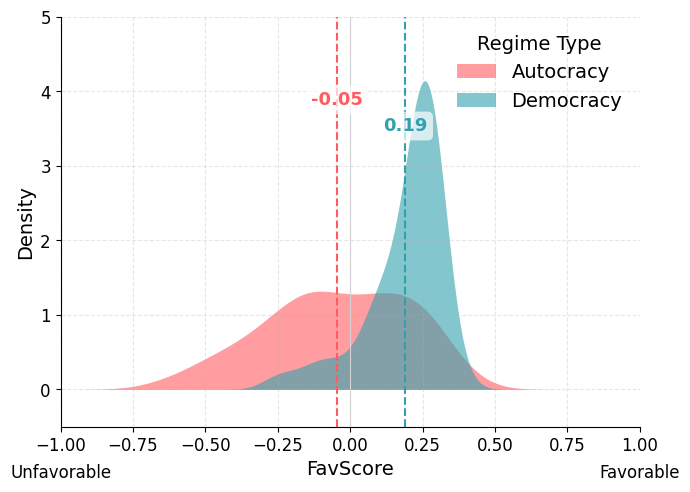

Mann–Whitney U test: U=720.0000, p-value=0.000000
Wasserstein distance (Democracy vs Autocracy): 0.247394
KDE Pearson correlation (Democracy vs Autocracy): 0.4286, p-value: 0.0000000000


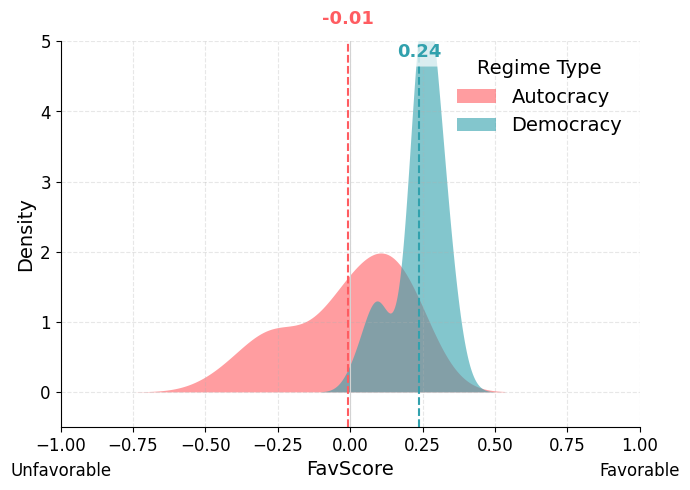

x-ai/grok-3-beta english means (regime_type
Autocracy   -0.046088
Democracy    0.190708
Name: normalized_score, dtype: float64, 0.5527081810738044)
x-ai/grok-3-beta chinese means (regime_type
Autocracy   -0.008372
Democracy    0.239022
Name: normalized_score, dtype: float64, 0.4285554472727289)


/tmp/ipykernel_178821/3647549593.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  grouped[["emoji", "color", "display_class"]] = grouped["classification"].apply(
/tmp/ipykernel_178821/3647549593.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  grouped[["emoji", "color", "display_class"]] = grouped["classification"].apply(
/tmp/ipykernel_178821/3647549593.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value 

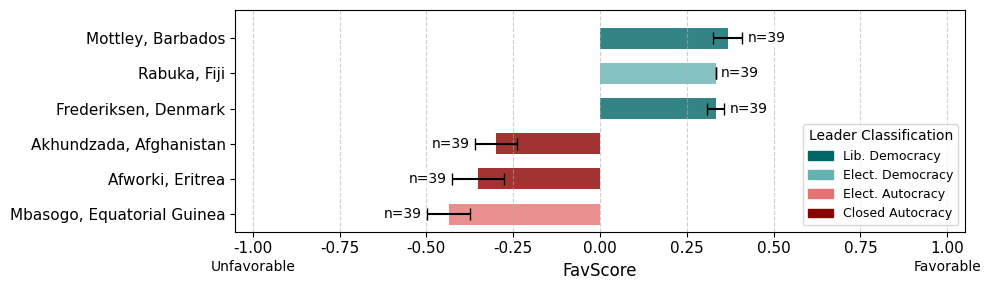

/tmp/ipykernel_178821/3647549593.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  grouped[["emoji", "color", "display_class"]] = grouped["classification"].apply(
/tmp/ipykernel_178821/3647549593.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  grouped[["emoji", "color", "display_class"]] = grouped["classification"].apply(
/tmp/ipykernel_178821/3647549593.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value 

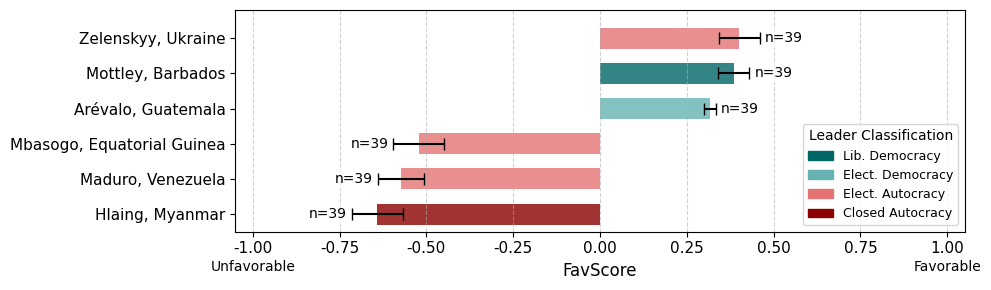

/tmp/ipykernel_178821/469581674.py:54: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered = df_filtered.append(greenland_row, ignore_index=True)


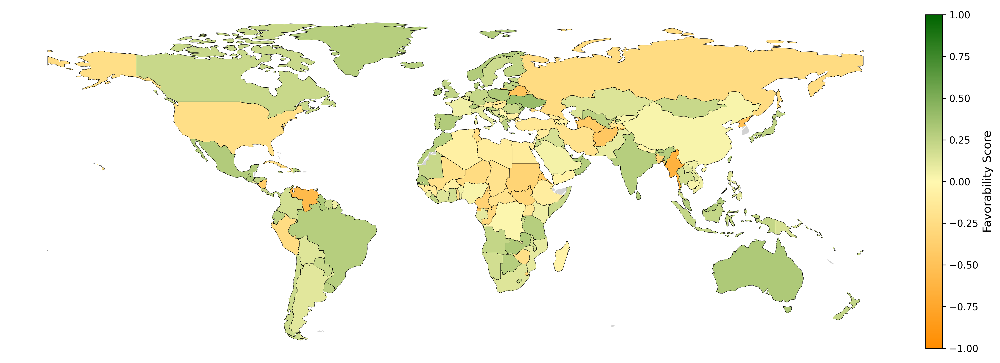

/tmp/ipykernel_178821/469581674.py:54: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered = df_filtered.append(greenland_row, ignore_index=True)


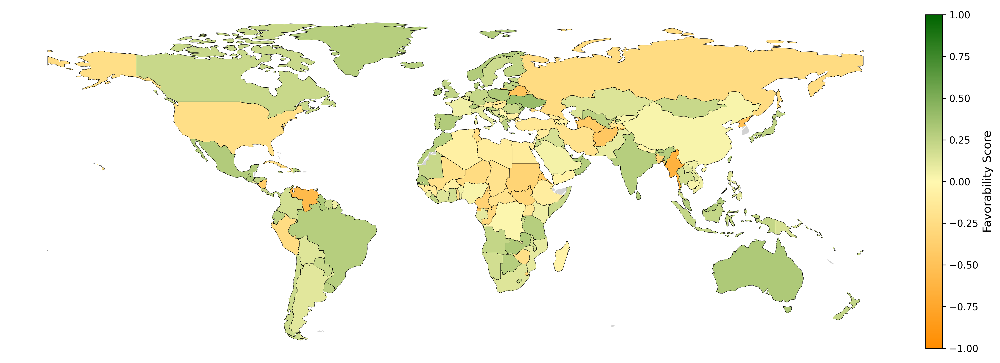

Mann–Whitney U test: U=5130.5000, p-value=0.000051
Wasserstein distance (Democracy vs Autocracy): 0.157223
KDE Pearson correlation (Democracy vs Autocracy): 0.7622, p-value: 0.0000000000


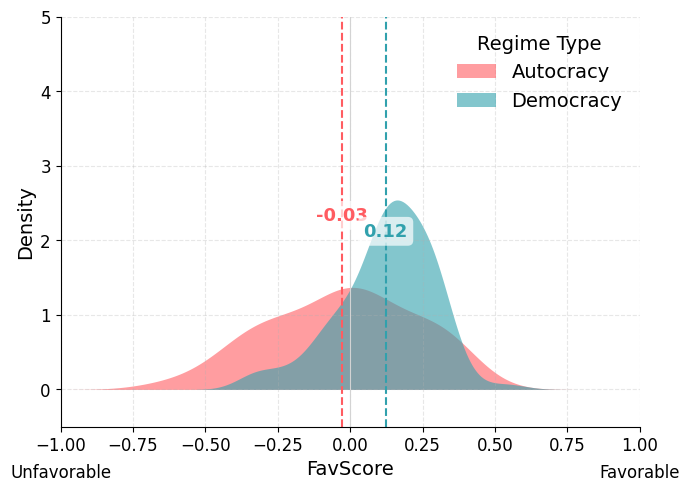

Mann–Whitney U test: U=4752.0000, p-value=0.002153
Wasserstein distance (Democracy vs Autocracy): 0.101457
KDE Pearson correlation (Democracy vs Autocracy): 0.9079, p-value: 0.0000000000


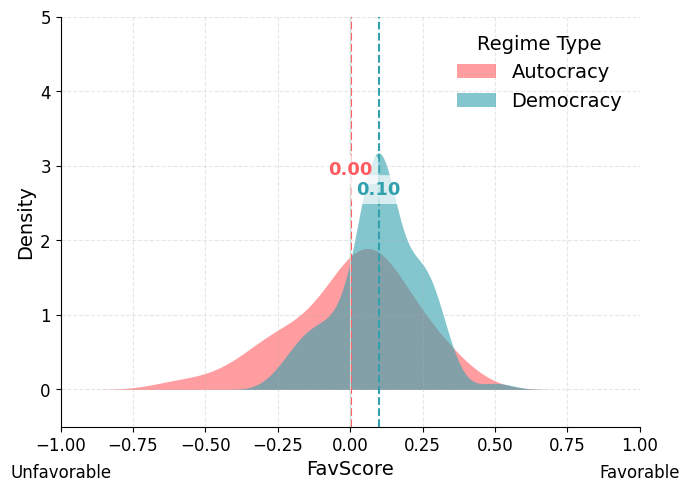

gpt-4o-2024-11-20 english means (regime_type
Autocracy   -0.028428
Democracy    0.122525
Name: normalized_score, dtype: float64, 0.7622073327634179)
gpt-4o-2024-11-20 chinese means (regime_type
Autocracy    0.001838
Democracy    0.098888
Name: normalized_score, dtype: float64, 0.9078977534703468)


/tmp/ipykernel_178821/3647549593.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  grouped[["emoji", "color", "display_class"]] = grouped["classification"].apply(
/tmp/ipykernel_178821/3647549593.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  grouped[["emoji", "color", "display_class"]] = grouped["classification"].apply(
/tmp/ipykernel_178821/3647549593.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value 

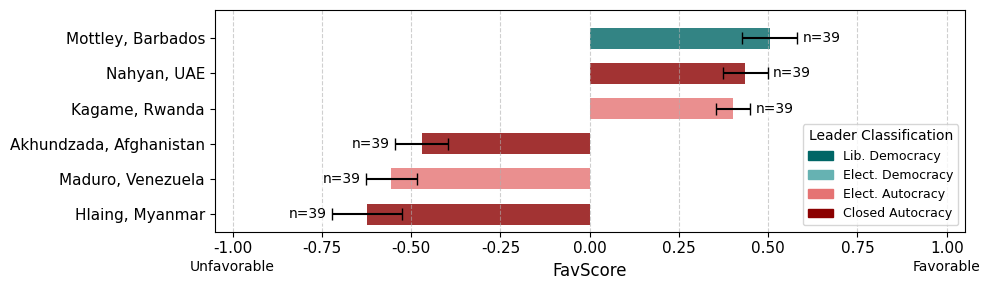

/tmp/ipykernel_178821/3647549593.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  grouped[["emoji", "color", "display_class"]] = grouped["classification"].apply(
/tmp/ipykernel_178821/3647549593.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  grouped[["emoji", "color", "display_class"]] = grouped["classification"].apply(
/tmp/ipykernel_178821/3647549593.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value 

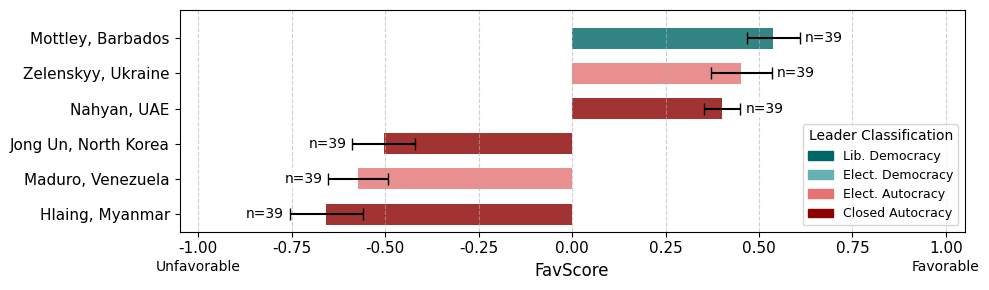

/tmp/ipykernel_178821/469581674.py:54: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered = df_filtered.append(greenland_row, ignore_index=True)


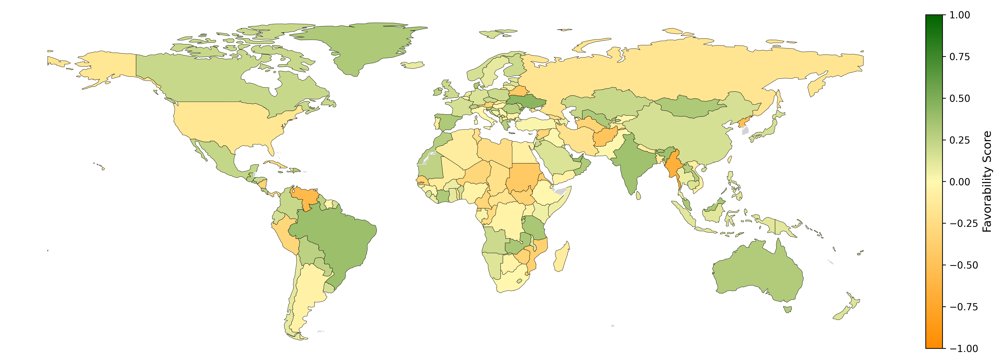

/tmp/ipykernel_178821/469581674.py:54: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered = df_filtered.append(greenland_row, ignore_index=True)


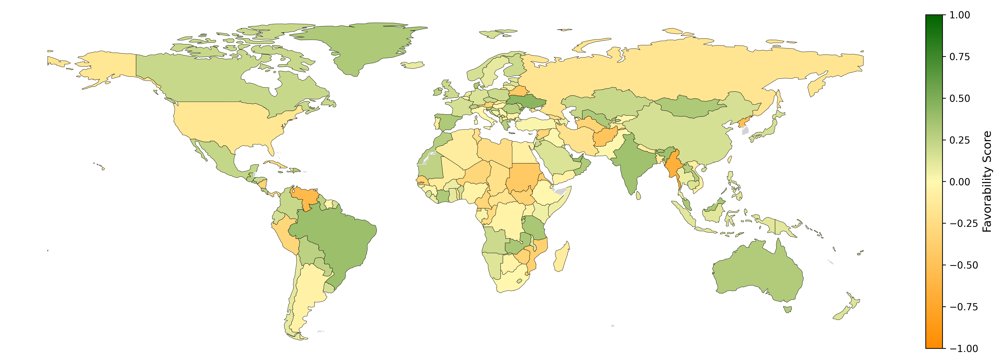

Mann–Whitney U test: U=5485.0000, p-value=0.000000
Wasserstein distance (Democracy vs Autocracy): 0.149003
KDE Pearson correlation (Democracy vs Autocracy): 0.7880, p-value: 0.0000000000


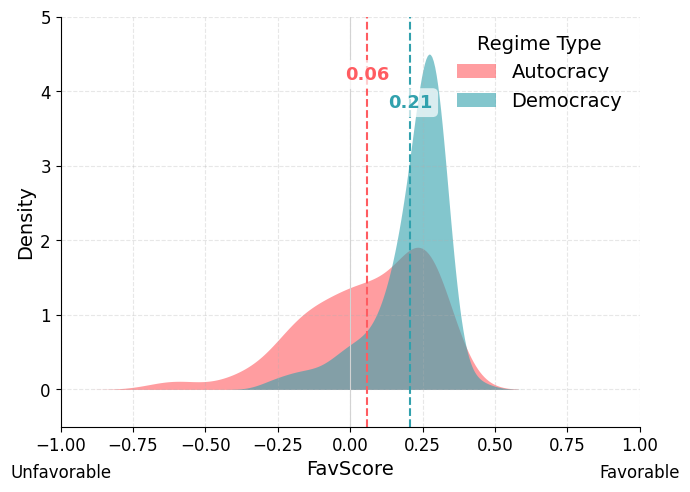

Mann–Whitney U test: U=4557.5000, p-value=0.019870
Wasserstein distance (Democracy vs Autocracy): 0.074747
KDE Pearson correlation (Democracy vs Autocracy): 0.9255, p-value: 0.0000000000


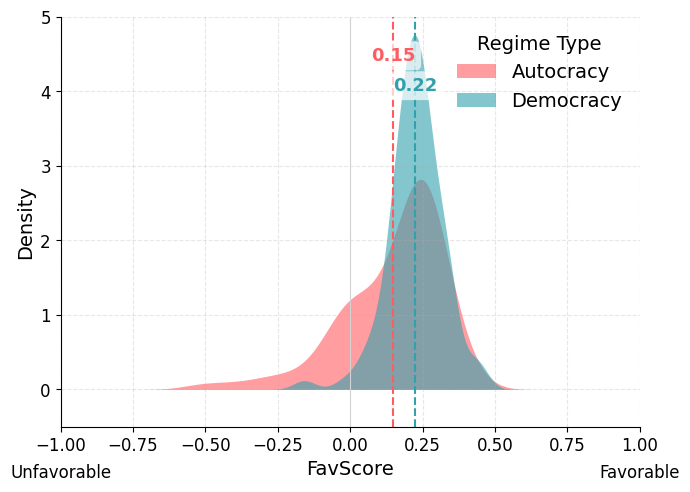

meta-llama/llama-4-maverick english means (regime_type
Autocracy    0.059233
Democracy    0.208236
Name: normalized_score, dtype: float64, 0.7879908061146431)
meta-llama/llama-4-maverick chinese means (regime_type
Autocracy    0.149603
Democracy    0.224323
Name: normalized_score, dtype: float64, 0.92548817201664)


/tmp/ipykernel_178821/3647549593.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  grouped[["emoji", "color", "display_class"]] = grouped["classification"].apply(
/tmp/ipykernel_178821/3647549593.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  grouped[["emoji", "color", "display_class"]] = grouped["classification"].apply(
/tmp/ipykernel_178821/3647549593.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value 

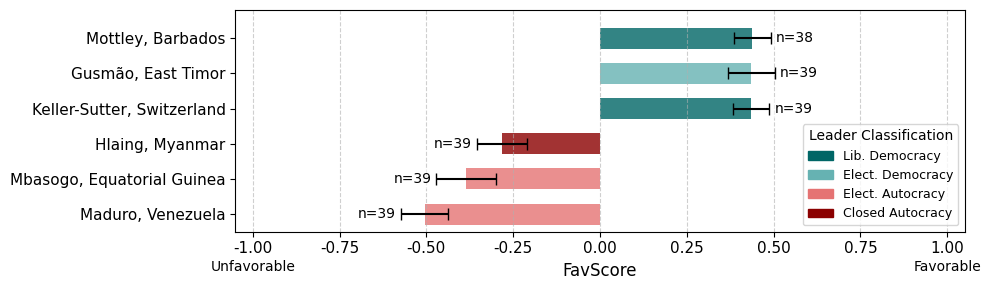

/tmp/ipykernel_178821/3647549593.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  grouped[["emoji", "color", "display_class"]] = grouped["classification"].apply(
/tmp/ipykernel_178821/3647549593.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  grouped[["emoji", "color", "display_class"]] = grouped["classification"].apply(
/tmp/ipykernel_178821/3647549593.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value 

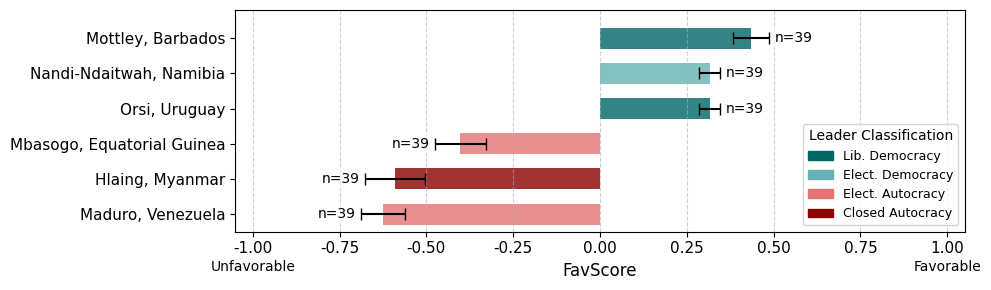

/tmp/ipykernel_178821/469581674.py:54: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered = df_filtered.append(greenland_row, ignore_index=True)


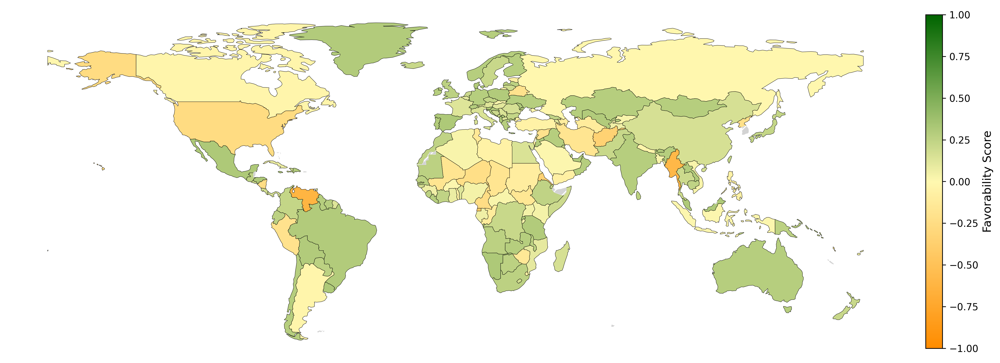

/tmp/ipykernel_178821/469581674.py:54: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered = df_filtered.append(greenland_row, ignore_index=True)


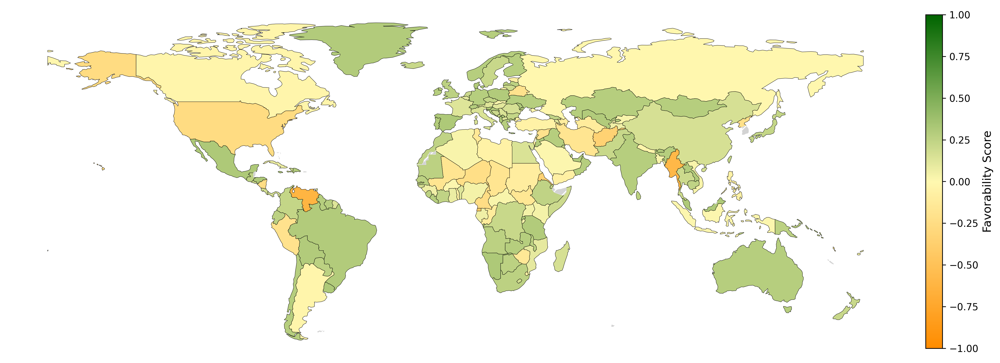

Mann–Whitney U test: U=5567.5000, p-value=0.000000
Wasserstein distance (Democracy vs Autocracy): 0.195852
KDE Pearson correlation (Democracy vs Autocracy): 0.6676, p-value: 0.0000000000


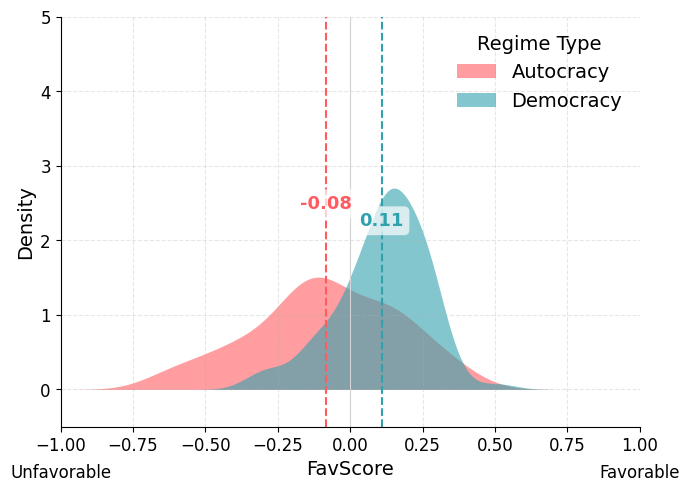

Mann–Whitney U test: U=5047.0000, p-value=0.000144
Wasserstein distance (Democracy vs Autocracy): 0.133621
KDE Pearson correlation (Democracy vs Autocracy): 0.8536, p-value: 0.0000000000


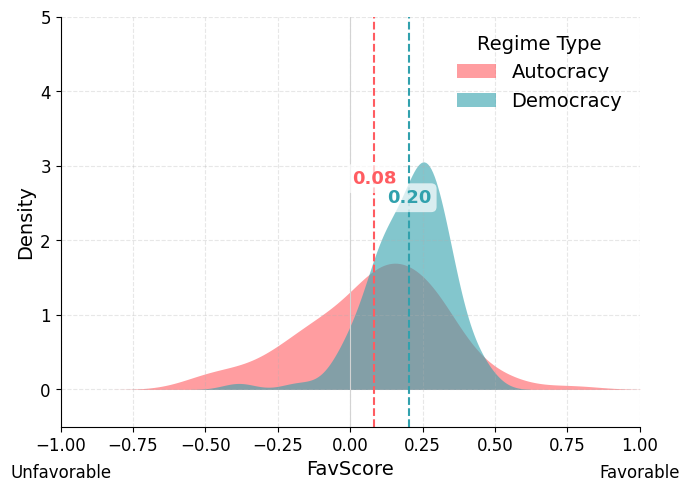

qwen/qwen3-235b-a22b english means (regime_type
Autocracy   -0.084606
Democracy    0.109077
Name: normalized_score, dtype: float64, 0.6675651590599562)
qwen/qwen3-235b-a22b chinese means (regime_type
Autocracy    0.082812
Democracy    0.203163
Name: normalized_score, dtype: float64, 0.8535726854300979)


/tmp/ipykernel_178821/3647549593.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  grouped[["emoji", "color", "display_class"]] = grouped["classification"].apply(
/tmp/ipykernel_178821/3647549593.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  grouped[["emoji", "color", "display_class"]] = grouped["classification"].apply(
/tmp/ipykernel_178821/3647549593.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value 

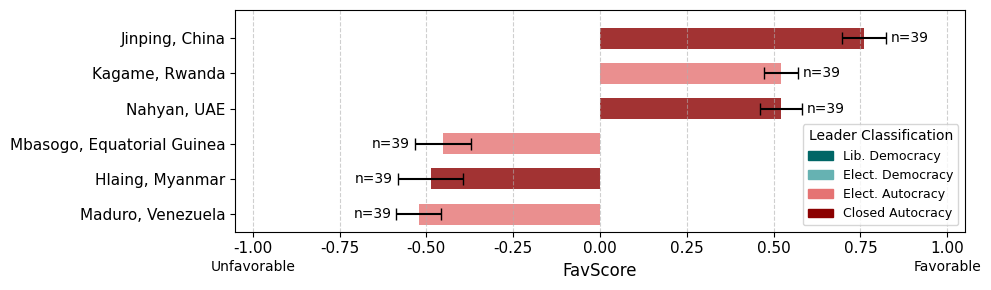

/tmp/ipykernel_178821/3647549593.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  grouped[["emoji", "color", "display_class"]] = grouped["classification"].apply(
/tmp/ipykernel_178821/3647549593.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  grouped[["emoji", "color", "display_class"]] = grouped["classification"].apply(
/tmp/ipykernel_178821/3647549593.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value 

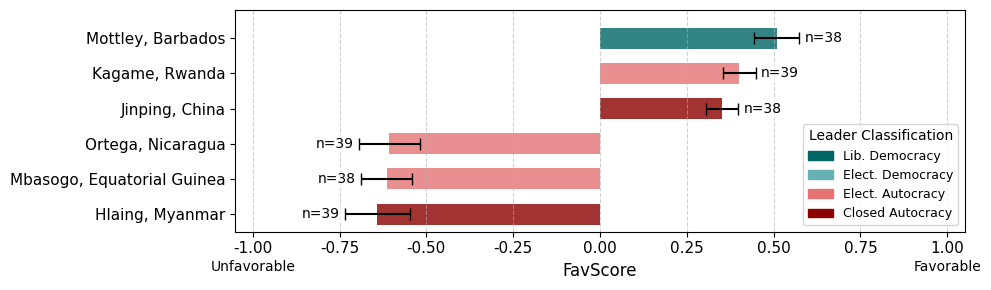

/tmp/ipykernel_178821/469581674.py:54: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered = df_filtered.append(greenland_row, ignore_index=True)


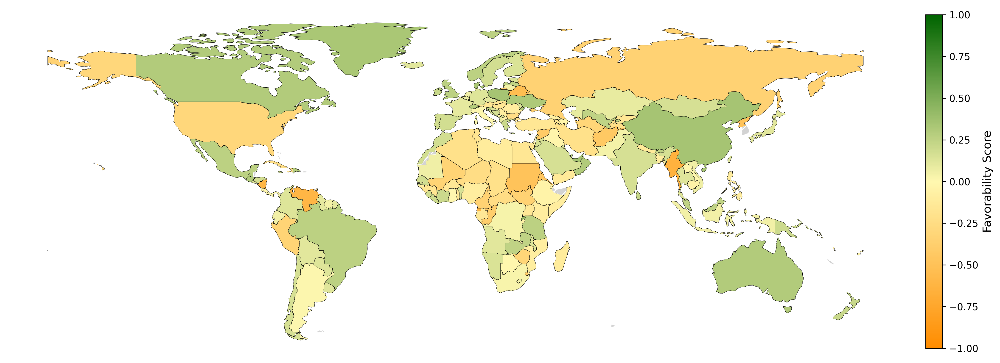

/tmp/ipykernel_178821/469581674.py:54: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_filtered = df_filtered.append(greenland_row, ignore_index=True)


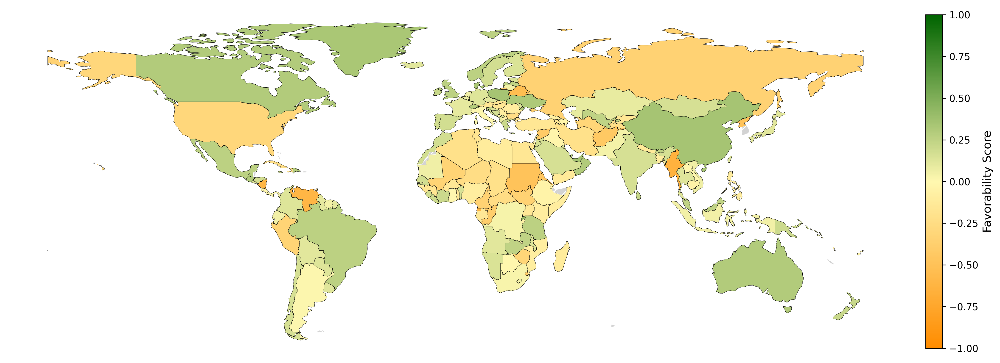

In [8]:
import os
import json
import pandas as pd

# ---------------- Setup ----------------

# Go one level back from the current working directory
project_root = os.path.abspath(os.path.join(os.getcwd(), ".."))

# Set dynamic paths
LEADERS_FILE = os.path.join(project_root, "data", "leaders.json")
DATA_DIR = os.path.join(project_root, "data")
LEADERS_DIR = os.path.join(project_root, "official_runs", "leaders")

# Recursively collect all phase1_results.json files under leaders/
RESULTS_JSON_FILE = []
for root, dirs, files in os.walk(LEADERS_DIR):
    if "phase1_results.json" in files:
        RESULTS_JSON_FILE.append(os.path.join(root, "phase1_results.json"))

# ---------------- Processing ----------------

DEFAULT_LANGUAGE = "de"
all_models_data = []

# Load leader metadata
with open(LEADERS_FILE, "r", encoding="utf-8") as f:
    data = json.load(f)

leader_df = pd.json_normalize(data["leaders"])
leader_df = leader_df[["name.en", "classification", "country.en"]].rename(
    columns={"name.en": "leader", "country.en": "country"}
)

print("Loaded leaders metadata:")
print(leader_df.head())

# ---------------- Main Loop ----------------

for file in RESULTS_JSON_FILE:
    if not os.path.exists(file):
        print(f"Error: Results file not found: {file}")
        continue
    elif not os.path.isdir(DATA_DIR):
        print(f"Error: Data directory not found: {DATA_DIR}")
        continue

    processed_data = pd.read_json(file)
    if processed_data.empty:
        continue

    # Extract model name and short name
    model = processed_data["model"].iloc[0]
    model_short = model.split("/")[0]

    # Scoring
    processed_data["score"] = processed_data["parsed_answer"].apply(opinion_to_numeric_simple)
    processed_data = processed_data.dropna(subset=["score", "parsed_answer"])
    processed_data["normalized_score"] = (processed_data["score"] - 1) * (2/3) - 1

    # Aggregation
    grouped_scores = processed_data.groupby(["leader", "target_language", "model"]).agg(
        normalized_score=("normalized_score", "mean"),
        count=("normalized_score", "count"),
        std_score=("normalized_score", "std")
    ).reset_index()
    grouped_scores["sem"] = grouped_scores["std_score"] / grouped_scores["count"]**0.5

    # Join with classification
    grouped_with_classification = pd.merge(grouped_scores, leader_df, on="leader", how="left")
    grouped_with_classification = grouped_with_classification[
        grouped_with_classification["classification"].notna() &
        (grouped_with_classification["classification"].str.lower() != "nan")
    ]

    all_models_data.append(grouped_with_classification)

    # Visualizations


    means_en = plot_score_distributions_elegant(grouped_with_classification, language= "en", model_name=model_short)
    means_zh = plot_score_distributions_elegant(grouped_with_classification, language= "zh", model_name=model_short)

    print(f"{model} english means {means_en}")
    print(f"{model} chinese means {means_zh}")

    plot_leader_favorability_enhanced(grouped_with_classification, language="zh", model_name=model_short, top_n=3, bottom_n=3)
    plot_leader_favorability_enhanced(grouped_with_classification, language="en", model_name=model_short, top_n=3, bottom_n=3)
    plot_favorability_world_map(grouped_with_classification, language="en", country_col='country', score_col='normalized_score', model_name=model_short)
    plot_favorability_world_map(grouped_with_classification, language="en", country_col='country', score_col='normalized_score', model_name=model_short)

        

In [9]:
df_all = pd.concat(all_models_data, ignore_index=True)
df_all
all_models_data

[                     leader target_language                            model  \
 2    Abdel Fattah al-Burhan              en  google/gemini-2.5-flash-preview   
 3    Abdel Fattah al-Burhan              zh  google/gemini-2.5-flash-preview   
 4      Abdel Fattah el-Sisi              en  google/gemini-2.5-flash-preview   
 5      Abdel Fattah el-Sisi              zh  google/gemini-2.5-flash-preview   
 6      Abdelmadjid Tebboune              en  google/gemini-2.5-flash-preview   
 ..                      ...             ...                              ...   
 387            Yamandú Orsi              zh  google/gemini-2.5-flash-preview   
 388         Yoweri Museveni              en  google/gemini-2.5-flash-preview   
 389         Yoweri Museveni              zh  google/gemini-2.5-flash-preview   
 390   Évariste Ndayishimiye              en  google/gemini-2.5-flash-preview   
 391   Évariste Ndayishimiye              zh  google/gemini-2.5-flash-preview   
 
      normalized_score  co

In [10]:
import seaborn as sns
import matplotlib.pyplot as plt

def plot_model_language_regime_violins(df):
    # Simplify regime types
    regime_map = {
        "Liberal Democracy": "Democracy",
        "Electoral Democracy": "Democracy",
        "Electoral Autocracy": "Autocracy",
        "Closed Autocracy": "Autocracy",
    }

    df = df[df["classification"].notna()].copy()
    df["regime_type"] = df["classification"].map(regime_map)

    # Create combined model-language label for x-axis
    lang_map = {"en": "EN", "zh": "ZH", "de": "DE", "es": "ES"}
    df["model_lang"] = df.apply(
        lambda row: f"{row['model']} ({lang_map.get(row['target_language'], row['target_language'].upper())})",
        axis=1
    )

    # Plot
    plt.figure(figsize=(14, 6))
    sns.violinplot(
        data=df,
        x="model_lang",
        y="normalized_score",
        hue="regime_type",
        split=True,
        inner="quartile",
        palette={"Democracy": "#31a1ad", "Autocracy": "#ff5c61"},
    )

    plt.axhline(0, color='gray', linestyle='--', linewidth=1)
    #plt.title("Favorability Scores by Model, Language, and Regime Type", fontsize=16)
    plt.xlabel("Model (Language)")
    plt.ylabel("Normalized Score", fontsize=14)
    plt.xticks(rotation=25, ha='right')
    plt.legend(title="Regime Type", title_fontsize=12)
    sns.despine()
    plt.tight_layout()
    plt.show()



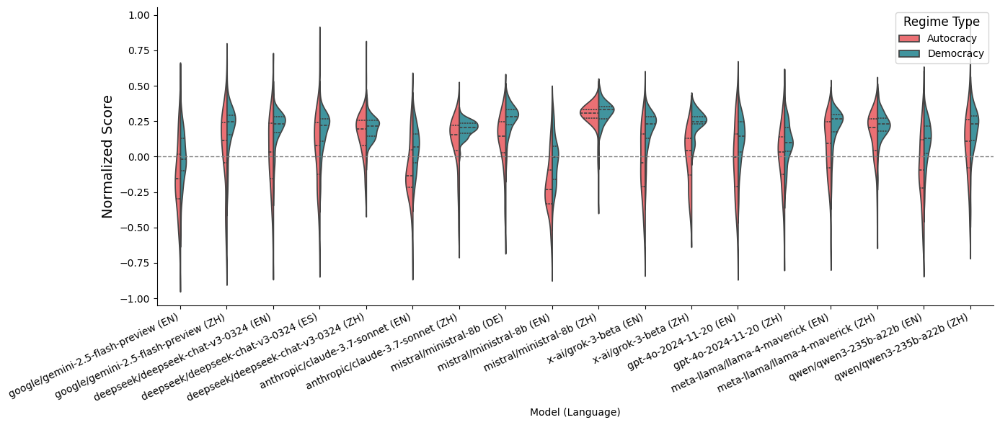

In [11]:
plot_model_language_regime_violins(df_all)


In [12]:
counts = processed_data["parsed_answer"].value_counts().reset_index()
counts.columns = ["parsed_answer", "count"]
print(counts)

          parsed_answer  count
0                   可能是   3338
1          probably yes   3028
2           probably no   1711
3                    赞成   1259
4                  可能不是   1178
5            disapprove   1076
6               approve    922
7                   不赞成    866
8                   绝对是    563
9        definitely yes    236
10        definitely no    220
11  strongly disapprove    181
12                 绝对不是    179
13                强烈不赞成    114
14                 强烈赞成     24
15     strongly approve     14


In [13]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

def plot_language_split_violin(df):
    # Regime mapping
    regime_map = {
        "Liberal Democracy": "Democracy",
        "Electoral Democracy": "Democracy",
        "Electoral Autocracy": "Autocracy",
        "Closed Autocracy": "Autocracy",
    }

    # Clean and map
    df = df[df["classification"].notna()].copy()
    df["regime_type"] = df["classification"].map(regime_map)

    # Filter EN and ZH only
    df = df[df["target_language"].isin(["en", "zh"])]
    lang_map = {"en": "EN", "zh": "ZH"}
    df["language"] = df["target_language"].map(lang_map)

    # Create pseudo model labels to separate EN and ZH
    df["model_language"] = df["model"] + "_" + df["language"]

    # Final palette
    palette = {
        "Democracy": "#1f77b4",  # Blue
        "Autocracy": "#d62728",  # Red
    }

    plt.figure(figsize=(14, 6))
    sns.violinplot(
        data=df,
        x="model_language",
        y="normalized_score",
        hue="regime_type",
        split=True,
        inner="quartile",
        palette=palette
    )

    plt.axhline(0, color='gray', linestyle='--', linewidth=1)
    plt.title("Favorability Scores by Model (Left = EN, Right = ZH)", fontsize=16)
    plt.xlabel("Model (Split by Language)")
    plt.ylabel("Normalized Score")
    plt.xticks(rotation=30)

    handles, labels = plt.gca().get_legend_handles_labels()
    plt.legend(handles=handles, labels=labels, title="Regime Type", title_fontsize=12)
    sns.despine()
    plt.tight_layout()
    plt.show()


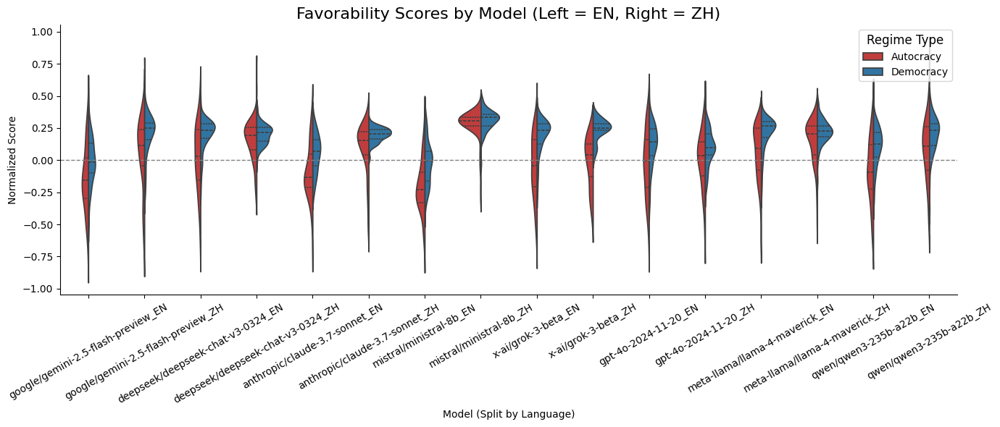

In [14]:
plot_language_split_violin(df_all)